# Esperimento Completo — Ottimizzazione Non Vincolata

Esegue la campagna sperimentale completa: 2 metodi × 2 problemi × 4 dimensioni × 6 starting point × 13 configurazioni di derivate.

**Metodi:** Modified Newton (MN), Truncated Newton (TN)  
**Problemi:** P16 (Banded Trigonometric, Hessiana diagonale), P28 (Variably Dimensioned, Hessiana densa)  
**Dimensioni:** n = 2, 10³, 10⁴, 10⁵  
**Derivate:** exact, only_hess_fd (6 varianti), both_fd (6 varianti)  

In [ ]:
# ============================================================
# CONFIGURAZIONE — modificare qui prima di lanciare
# ============================================================

# Se True: solo n=2, solo x_bar (verifica rapida del flusso)
# Se False: tutte le combinazioni complete
DRY_RUN = False

SEED = 323334
MAX_ITER = 1000
TIME_LIMIT = 20          # secondi per singola run
OOM_THRESHOLD_MB = 4096  # soglia memoria per Hessiana densa

# --- Criterio di arresto (modificare a piacere) ---
STOP_TOL = 1e-8
# Il criterio viene istanziato nel loop come:
#   GradNormAbsolute(tol=STOP_TOL)
# Per cambiare tipo di criterio, modificare la riga nel Cell 7.

# --- Parametri best da fine_tuning.ipynb ---
MN_PARAMS = dict(
    alpha0=1.0, c1=1e-4, rho=0.8,
    beta=1e-6, max_tau_iter=100, max_iter_backtrack=50,
)
TN_PARAMS = dict(
    alpha0=1.0, c1=1e-4, rho=0.8,
    forcing='quadratic', cg_max_iter=None, max_iter_backtrack=50,
)

# --- Dimensioni e starting point ---
if DRY_RUN:
    DIMENSIONS = [2]
    NUM_RANDOM = 0   # solo x_bar
else:
    DIMENSIONS = [2, 1_000, 10_000, 100_000]
    NUM_RANDOM = 5   # x_bar + 5 random = 6

K_VALUES = [4, 8, 12]

print(f"DRY_RUN = {DRY_RUN}")
print(f"Dimensioni: {DIMENSIONS}")
print(f"Starting point per (problema, n): {NUM_RANDOM + 1}")
print(f"Criterio: GradNormAbsolute(tol={STOP_TOL})")
print(f"MAX_ITER = {MAX_ITER}, TIME_LIMIT = {TIME_LIMIT}s")

DRY_RUN = False
Dimensioni: [2, 1000, 10000, 100000]
Starting point per (problema, n): 6
Criterio: GradNormAbsolute(tol=1e-08)
MAX_ITER = 1000, TIME_LIMIT = 60s


In [47]:
import time
import os
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from src.functions.problem16 import f16, x_bar_16
from src.functions.problem28 import f28, x_bar_28
from src.gradients.problem16 import grad_f16
from src.gradients.problem28 import grad_f28
from src.hessians.problem16 import hess_f16
from src.hessians.problem28 import hess_f28
from src.methods.modified_newton import modified_newton
from src.methods.truncated_newton import truncated_newton
from src.stopping_criteria.absolute.grad_norm import GradNormAbsolute
from src.starting_points import generate_starting_points

In [48]:
# ============================================================
# Funzioni helper
# ============================================================

def experimental_rate(g_norms):
    """Stima dell'ordine di convergenza dalla sequenza ||g_k||."""
    e = np.asarray(g_norms, dtype=float)
    if e.size < 4:
        return float('nan')
    e = e[e > 1e-14]
    if e.size < 4:
        return float('nan')
    log_e = np.log(e)
    num = np.diff(log_e)[1:]
    den = np.diff(log_e)[:-1]
    mask = (np.abs(den) > 1e-12) & np.isfinite(num) & np.isfinite(den)
    if not mask.any():
        return float('nan')
    p_vals = num[mask] / den[mask]
    p_tail = p_vals[-min(5, p_vals.size):]
    return float(np.median(p_tail))


def expected_hessian_mb(n):
    return n * n * 8 / (1024 ** 2)


def should_skip(method, prob_id, n, deriv_mode):
    """True se la combinazione va saltata per limiti di memoria.

    MN: richiede sempre la matrice Hessiana piena (Cholesky).
        - exact + P16 (sparsa diagonale): OK
        - exact + P28 (densa): skip se n^2*8 > soglia
        - FD hess (qualsiasi problema): hess_fd costruisce matrice densa n x n
    TN: con hess_f=None usa hv_fd (matrix-free), mai skip per FD.
        - exact + P16 (sparsa): OK
        - exact + P28 (densa): skip se n^2*8 > soglia
    """
    if deriv_mode == 'exact':
        if prob_id == 'P16':
            return False
        return expected_hessian_mb(n) > OOM_THRESHOLD_MB

    # FD modes
    if method == 'TN':
        return False
    return expected_hessian_mb(n) > OOM_THRESHOLD_MB

In [49]:
# ============================================================
# Definizioni problemi, metodi, configurazioni derivate
# ============================================================

PROBLEMS = {
    'P16': dict(f=f16, grad=grad_f16, hess=hess_f16, x_bar_fn=x_bar_16),
    'P28': dict(f=f28, grad=grad_f28, hess=hess_f28, x_bar_fn=x_bar_28),
}

METHODS_LIST = [
    ('MN', modified_newton, MN_PARAMS),
    ('TN', truncated_newton, TN_PARAMS),
]

# 13 configurazioni di derivate
DERIV_CONFIGS = []

# 1. exact
DERIV_CONFIGS.append(dict(deriv_mode='exact', h_type='', k=None, scaled=None))

# 2-7. only_hess_fd x {fixed, specific} x {k=4, k=8, k=12}
for k_val in K_VALUES:
    DERIV_CONFIGS.append(dict(deriv_mode='only_hess_fd', h_type='fixed',
                              k=k_val, scaled=False))
    DERIV_CONFIGS.append(dict(deriv_mode='only_hess_fd', h_type='specific',
                              k=k_val, scaled=True))

# 8-13. both_fd x {fixed, specific} x {k=4, k=8, k=12}
for k_val in K_VALUES:
    DERIV_CONFIGS.append(dict(deriv_mode='both_fd', h_type='fixed',
                              k=k_val, scaled=False))
    DERIV_CONFIGS.append(dict(deriv_mode='both_fd', h_type='specific',
                              k=k_val, scaled=True))

print(f"{len(DERIV_CONFIGS)} configurazioni di derivate:")
for i, dc in enumerate(DERIV_CONFIGS, 1):
    if dc['deriv_mode'] == 'exact':
        print(f"  {i:>2d}. exact")
    else:
        print(f"  {i:>2d}. {dc['deriv_mode']}, h={dc['h_type']}, k={dc['k']}")


def build_method_kwargs(method_name, method_params, pinfo, dcfg):
    """Costruisce i kwargs per la chiamata al metodo."""
    kw = dict(method_params)  # copia dei parametri best

    if dcfg['deriv_mode'] == 'exact':
        kw['grad_f'] = pinfo['grad']
        kw['hess_f'] = pinfo['hess']
    elif dcfg['deriv_mode'] == 'only_hess_fd':
        kw['grad_f'] = pinfo['grad']
        kw['hess_f'] = None
        kw['k'] = dcfg['k']
        kw['scaled'] = dcfg['scaled']
    elif dcfg['deriv_mode'] == 'both_fd':
        kw['grad_f'] = None
        kw['hess_f'] = None
        kw['k'] = dcfg['k']
        kw['scaled'] = dcfg['scaled']

    return kw

13 configurazioni di derivate:
   1. exact
   2. only_hess_fd, h=fixed, k=4
   3. only_hess_fd, h=specific, k=4
   4. only_hess_fd, h=fixed, k=8
   5. only_hess_fd, h=specific, k=8
   6. only_hess_fd, h=fixed, k=12
   7. only_hess_fd, h=specific, k=12
   8. both_fd, h=fixed, k=4
   9. both_fd, h=specific, k=4
  10. both_fd, h=fixed, k=8
  11. both_fd, h=specific, k=8
  12. both_fd, h=fixed, k=12
  13. both_fd, h=specific, k=12


In [50]:
# ============================================================
# Generazione starting point (una sola volta, seed fisso)
# ============================================================

rng = np.random.default_rng(SEED)
starts_cache = {}

for prob_id in ('P16', 'P28'):
    for n in DIMENSIONS:
        x_bar = PROBLEMS[prob_id]['x_bar_fn'](n)
        pts = generate_starting_points(x_bar, num_random=NUM_RANDOM, rng=rng)
        starts_cache[(prob_id, n)] = pts
        print(f"{prob_id} n={n:>6d}: {len(pts)} starting point generati")

P16 n=     2: 6 starting point generati
P16 n=  1000: 6 starting point generati
P16 n= 10000: 6 starting point generati
P16 n=100000: 6 starting point generati
P28 n=     2: 6 starting point generati
P28 n=  1000: 6 starting point generati
P28 n= 10000: 6 starting point generati
P28 n=100000: 6 starting point generati


In [ ]:
# ============================================================
# Loop sperimentale principale
# ============================================================

# Conta totale run (per progress)
total_runs = 0
for method_name, _, _ in METHODS_LIST:
    for prob_id in PROBLEMS:
        for n in DIMENSIONS:
            for dcfg in DERIV_CONFIGS:
                if should_skip(method_name, prob_id, n, dcfg['deriv_mode']):
                    continue
                total_runs += len(starts_cache[(prob_id, n)])
print(f"Run totali da eseguire: {total_runs}")
print("=" * 80)

rows = []
histories = {}  # (method, prob, n, si, deriv_mode, h_type, k) -> {grad_norms, x_path, success}
idx = 0
t_global = time.perf_counter()

for method_name, method_fn, method_params in METHODS_LIST:
    for prob_id, pinfo in PROBLEMS.items():
        for n in DIMENSIONS:
            for dcfg in DERIV_CONFIGS:
                if should_skip(method_name, prob_id, n, dcfg['deriv_mode']):
                    continue

                mkw = build_method_kwargs(method_name, method_params, pinfo, dcfg)

                for si, x0 in enumerate(starts_cache[(prob_id, n)]):
                    idx += 1
                    stop = GradNormAbsolute(tol=STOP_TOL)

                    # Label per progress
                    dm = dcfg['deriv_mode']
                    ht = dcfg['h_type'] or '-'
                    kv = dcfg['k'] if dcfg['k'] is not None else '-'

                    try:
                        t0 = time.perf_counter()
                        res = method_fn(
                            pinfo['f'], x0, stop,
                            max_iter=MAX_ITER, time_limit=TIME_LIMIT,
                            return_history=True, **mkw,
                        )
                        elapsed = time.perf_counter() - t0

                        hist = res.get('history', [])
                        g_norms = [h['grad_norm'] for h in hist]
                        x_path = [h['x'] for h in hist] if n == 2 else None

                        rate = experimental_rate(g_norms) if res['success'] else float('nan')

                        row = dict(
                            method=method_name,
                            problem=prob_id,
                            n=n,
                            start_pt_id=si,
                            deriv_mode=dm,
                            h_type=dcfg['h_type'],
                            k=dcfg['k'] if dcfg['k'] is not None else '',
                            grad_norm=res['grad_norm'],
                            iters=res['n_iter'],
                            max_iters=MAX_ITER,
                            success=res['success'],
                            flag=res['stop_reason'],
                            conv_rate=rate,
                            time=elapsed,
                        )

                    except MemoryError:
                        elapsed = time.perf_counter() - t0
                        g_norms = []
                        x_path = None
                        row = dict(
                            method=method_name, problem=prob_id, n=n,
                            start_pt_id=si, deriv_mode=dm,
                            h_type=dcfg['h_type'],
                            k=dcfg['k'] if dcfg['k'] is not None else '',
                            grad_norm=float('nan'), iters=0, max_iters=MAX_ITER,
                            success=False, flag='MemoryError',
                            conv_rate=float('nan'), time=elapsed,
                        )

                    except Exception as exc:
                        elapsed = time.perf_counter() - t0
                        g_norms = []
                        x_path = None
                        row = dict(
                            method=method_name, problem=prob_id, n=n,
                            start_pt_id=si, deriv_mode=dm,
                            h_type=dcfg['h_type'],
                            k=dcfg['k'] if dcfg['k'] is not None else '',
                            grad_norm=float('nan'), iters=0, max_iters=MAX_ITER,
                            success=False, flag=f'err:{type(exc).__name__}',
                            conv_rate=float('nan'), time=elapsed,
                        )

                    rows.append(row)
                    hist_key = (method_name, prob_id, n, si, dm, dcfg['h_type'],
                                dcfg['k'] if dcfg['k'] is not None else '')
                    histories[hist_key] = dict(
                        grad_norms=g_norms, x_path=x_path, success=row['success'],
                    )

                    suc = 'OK' if row['success'] else row['flag']
                    print(f"[{idx:>4d}/{total_runs}] "
                          f"[{method_name} | {prob_id} | n={n} | sp={si} | "
                          f"{dm} | {ht} | k={kv}] "
                          f"-> success={row['success']} | "
                          f"iters={row['iters']} | time={elapsed:.2f}s")

elapsed_total = time.perf_counter() - t_global
print("=" * 80)
print(f"Completato: {idx} run in {elapsed_total:.1f}s ({elapsed_total/60:.1f} min)")

Run totali da eseguire: 1092
[   1/1092] [MN | P16 | n=2 | sp=0 | exact | - | k=-] -> success=True | iters=9 | time=0.02s
[   2/1092] [MN | P16 | n=2 | sp=1 | exact | - | k=-] -> success=True | iters=4 | time=0.00s
[   3/1092] [MN | P16 | n=2 | sp=2 | exact | - | k=-] -> success=True | iters=6 | time=0.00s
[   4/1092] [MN | P16 | n=2 | sp=3 | exact | - | k=-] -> success=True | iters=6 | time=0.00s
[   5/1092] [MN | P16 | n=2 | sp=4 | exact | - | k=-] -> success=True | iters=5 | time=0.00s
[   6/1092] [MN | P16 | n=2 | sp=5 | exact | - | k=-] -> success=True | iters=4 | time=0.00s
[   7/1092] [MN | P16 | n=2 | sp=0 | only_hess_fd | fixed | k=4] -> success=True | iters=9 | time=0.00s
[   8/1092] [MN | P16 | n=2 | sp=1 | only_hess_fd | fixed | k=4] -> success=True | iters=4 | time=0.00s
[   9/1092] [MN | P16 | n=2 | sp=2 | only_hess_fd | fixed | k=4] -> success=True | iters=6 | time=0.00s
[  10/1092] [MN | P16 | n=2 | sp=3 | only_hess_fd | fixed | k=4] -> success=True | iters=6 | time=0.0

In [ ]:
# ============================================================
# Salvataggio CSV
# ============================================================

results_dir = Path('results')
results_dir.mkdir(exist_ok=True)

df = pd.DataFrame(rows)
csv_path = results_dir / 'results.csv'
df.to_csv(csv_path, index=False)
print(f"Salvate {len(df)} righe in {csv_path}")
display(df.head(10))

Salvate 52 righe in results\results.csv


,method,problem,n,start_pt_id,deriv_mode,h_type,k,grad_norm,iters,max_iters,success,flag,conv_rate,time
0,MN,P16,2,0,exact,,,5.441226e-15,5,1000,True,grad_abs,2.918001,0.002228
1,MN,P16,2,0,only_hess_fd,fixed,4,5.440093e-15,5,1000,True,grad_abs,2.917928,0.001047
2,MN,P16,2,0,only_hess_fd,specific,4,7.045475e-13,5,1000,True,grad_abs,1.906571,0.001237
3,MN,P16,2,0,only_hess_fd,fixed,8,5.441226e-15,5,1000,True,grad_abs,2.917519,0.000722
4,MN,P16,2,0,only_hess_fd,specific,8,5.450279e-15,5,1000,True,grad_abs,2.918026,0.001026
5,MN,P16,2,0,only_hess_fd,fixed,12,6.962481e-10,6,1000,True,grad_abs,0.999083,0.000876
6,MN,P16,2,0,only_hess_fd,specific,12,1.522570e-12,5,1000,True,grad_abs,1.865694,0.000871
7,MN,P16,2,0,both_fd,fixed,4,1.110223e-12,5,1000,True,grad_abs,1.899919,0.001752
8,MN,P16,2,0,both_fd,specific,4,4.828078e-09,7,1000,True,grad_abs,2.198104,0.003014
9,MN,P16,2,0,both_fd,fixed,8,0.000000e+00,14,1000,True,grad_abs,0.909702,0.004533


In [ ]:
# ============================================================
# Generazione tabelle LaTeX
# ============================================================

tables_dir = results_dir / 'tables'
tables_dir.mkdir(exist_ok=True)


def _tex_escape(s):
    """Escape underscores for LaTeX text mode."""
    return str(s).replace('_', r'\_')


def make_latex_table(gdf, method, prob, n, deriv_mode, h_type, k_val):
    """Genera il codice LaTeX per una singola tabella."""
    gdf = gdf.sort_values('start_pt_id')

    # Caption
    cap_parts = [_tex_escape(method), _tex_escape(prob), f'$n={n}$',
                 r'\texttt{' + _tex_escape(deriv_mode) + '}']
    if deriv_mode != 'exact':
        cap_parts += [f'$h={h_type}$', f'$k={k_val}$']
    caption = ', '.join(cap_parts)

    lines = []
    lines.append(r'\begin{table}[htbp]')
    lines.append(r'\centering')
    lines.append(r'\begin{tabular}{cccclcr}')
    lines.append(r'\toprule')
    lines.append(r'SP & $\|\nabla f\|$ & iter/max & success & flag & conv\_rate & time (s) \\')
    lines.append(r'\midrule')

    for _, row in gdf.iterrows():
        sp = int(row['start_pt_id'])
        gn = f"${row['grad_norm']:.2e}$" if not np.isnan(row['grad_norm']) else '---'
        it_max = f"{int(row['iters'])}/{int(row['max_iters'])}"
        suc = 'yes' if row['success'] else 'no'
        flag = r'\texttt{' + _tex_escape(row['flag']) + '}'
        cr = f"{row['conv_rate']:.2f}" if not np.isnan(row['conv_rate']) else '---'
        tm = f"{row['time']:.2f}"
        lines.append(f'{sp} & {gn} & {it_max} & {suc} & {flag} & {cr} & {tm} \\\\')

    lines.append(r'\midrule')

    # Riga media (solo successi)
    succ = gdf[gdf['success'] == True]
    if len(succ) > 0:
        avg_gn = f"${succ['grad_norm'].mean():.2e}$"
        avg_it = f"{succ['iters'].mean():.1f}/{int(succ['max_iters'].iloc[0])}"
        avg_cr = succ['conv_rate'].dropna()
        avg_cr_str = f"{avg_cr.mean():.2f}" if len(avg_cr) > 0 else '---'
        avg_tm = f"{succ['time'].mean():.2f}"
        lines.append(f'Avg & {avg_gn} & {avg_it} & {len(succ)}/{len(gdf)} & --- & {avg_cr_str} & {avg_tm} \\\\')
    else:
        lines.append(f'Avg & --- & --- & 0/{len(gdf)} & --- & --- & --- \\\\')

    lines.append(r'\bottomrule')
    lines.append(r'\end{tabular}')
    lines.append(r'\caption{' + caption + '}')
    lines.append(r'\end{table}')

    return '\n'.join(lines)


# Generazione per ogni gruppo
n_tables = 0
for (method, prob, n_dim, dm, ht, kv), gdf in df.groupby(
    ['method', 'problem', 'n', 'deriv_mode', 'h_type', 'k'], dropna=False
):
    latex = make_latex_table(gdf, method, prob, n_dim, dm, ht, kv)

    # Nome file descrittivo
    if dm == 'exact':
        fname = f"table_{method}_{prob}_n{n_dim}_exact.tex"
    else:
        fname = f"table_{method}_{prob}_n{n_dim}_{dm}_{ht}_k{kv}.tex"

    (tables_dir / fname).write_text(latex, encoding='utf-8')
    n_tables += 1

print(f"Generate {n_tables} tabelle LaTeX in {tables_dir}/")

Generate 52 tabelle LaTeX in results\tables/


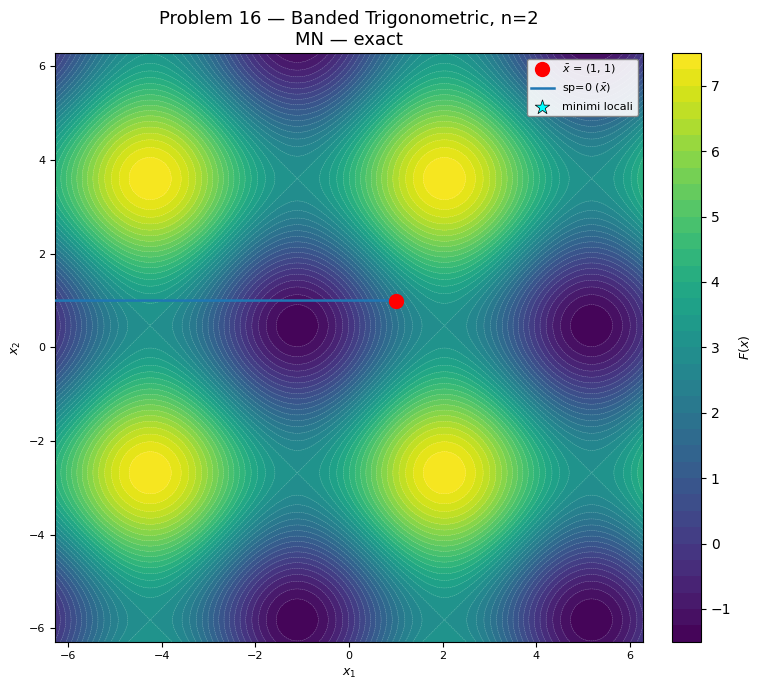

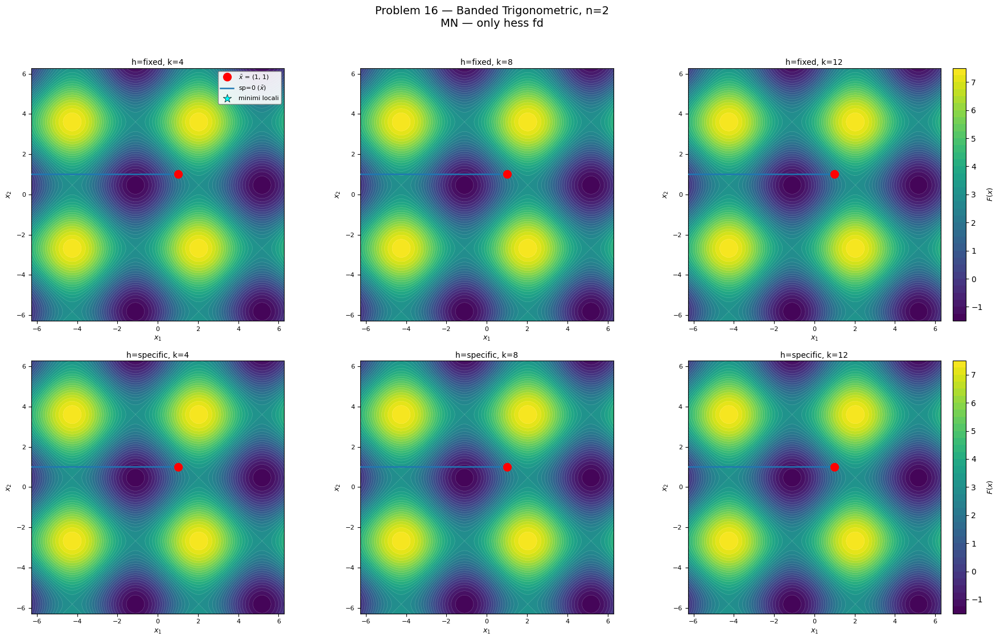

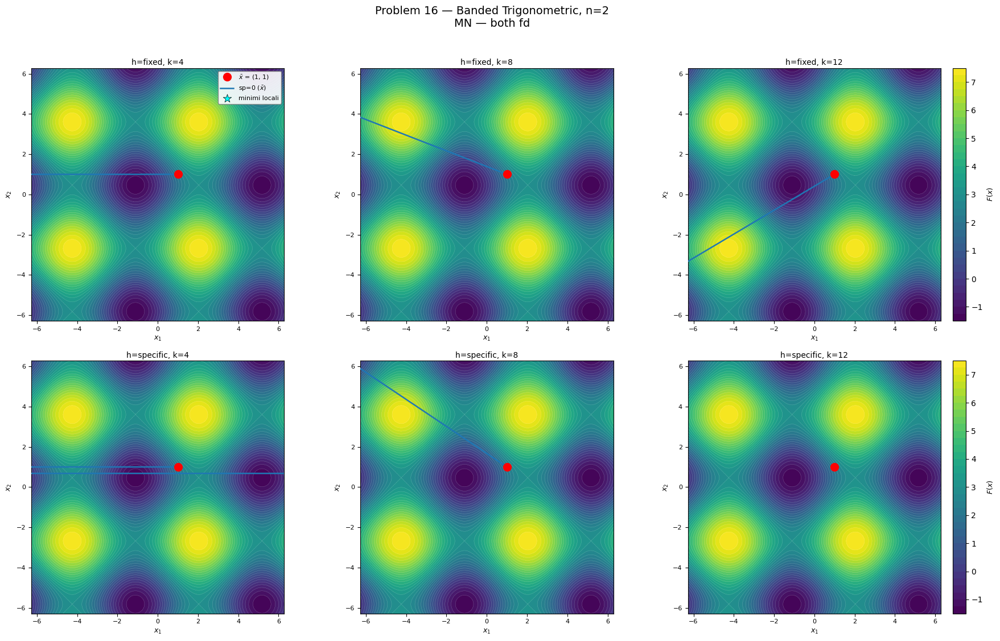

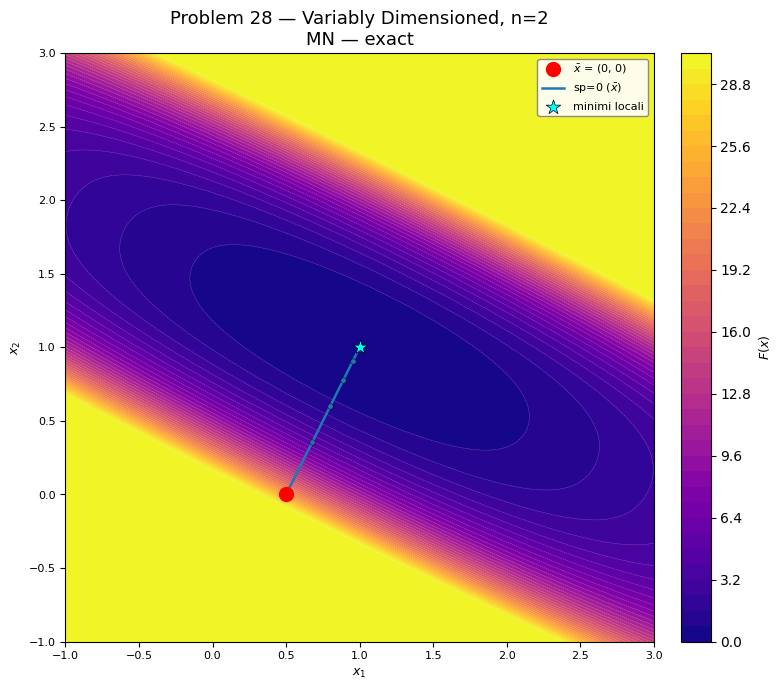

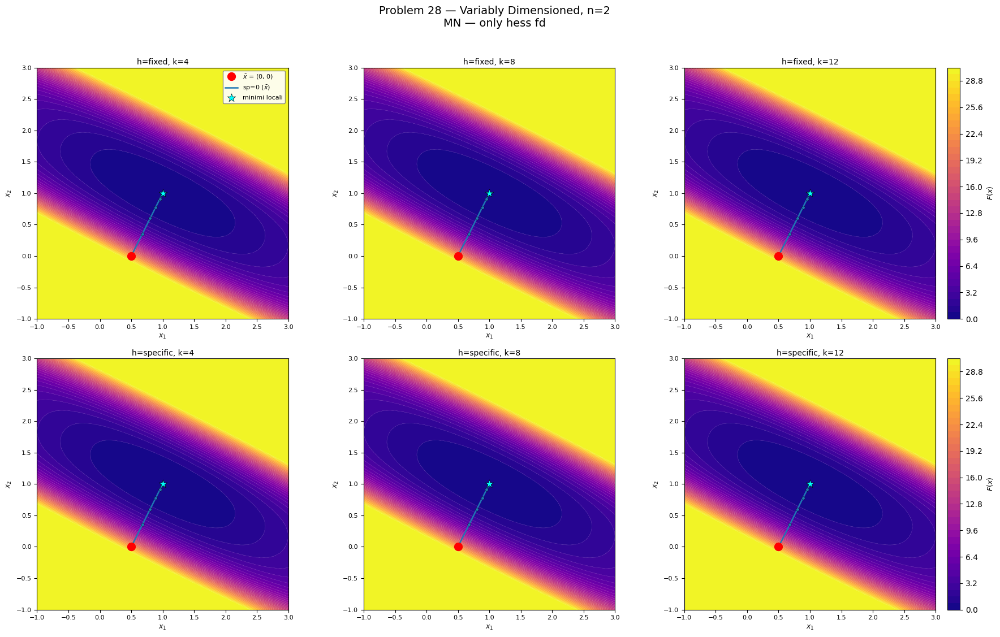

...

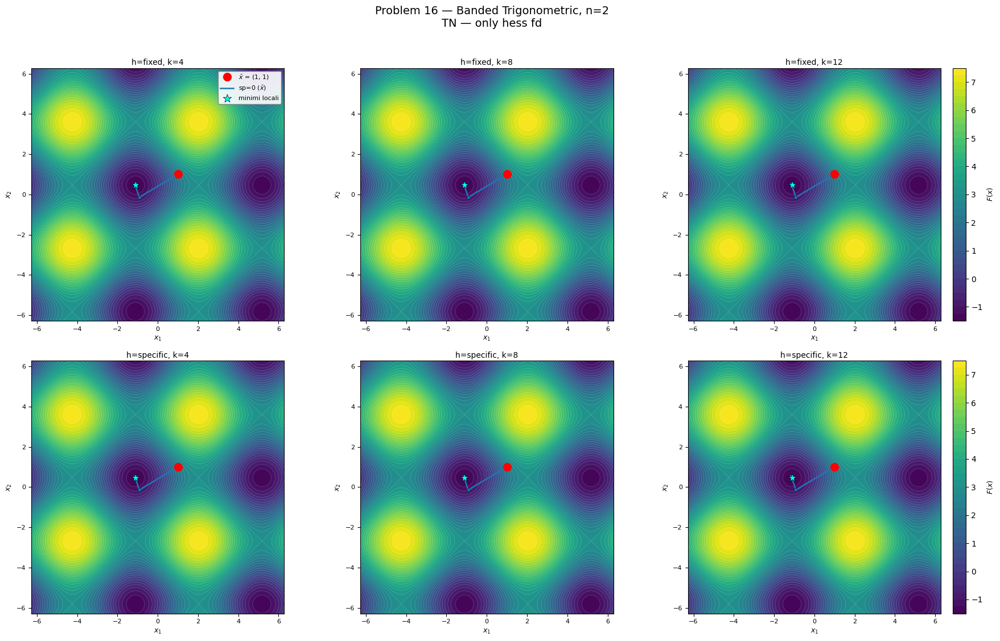

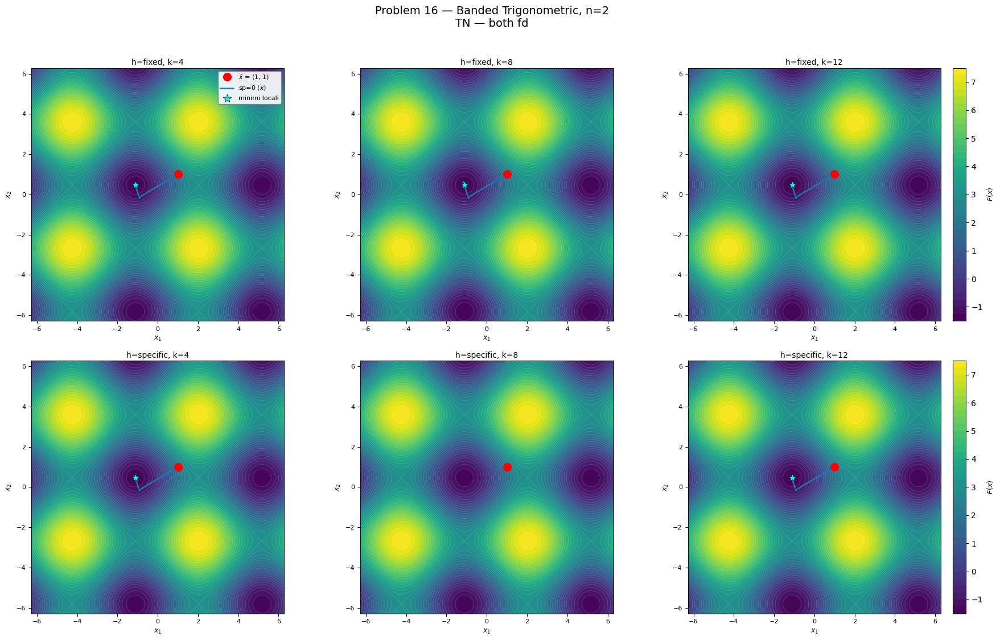

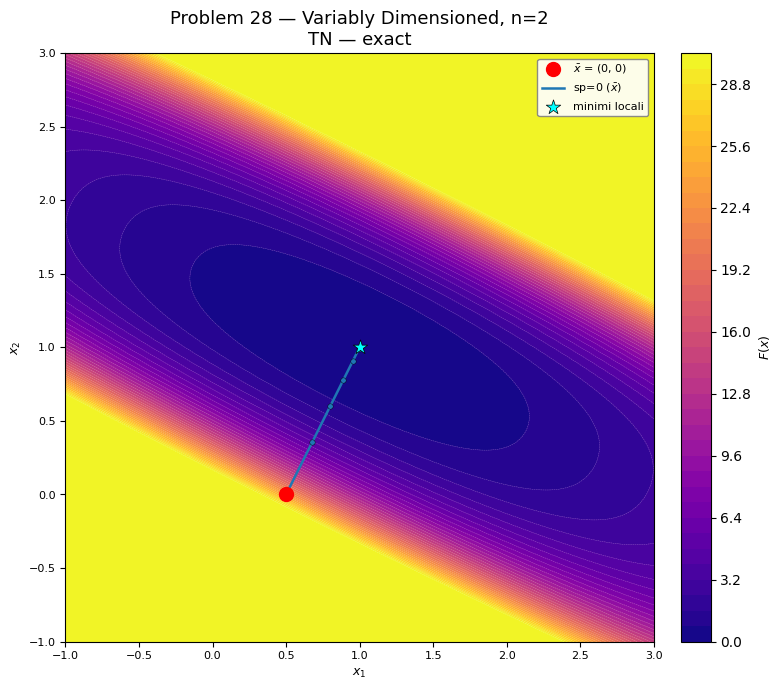

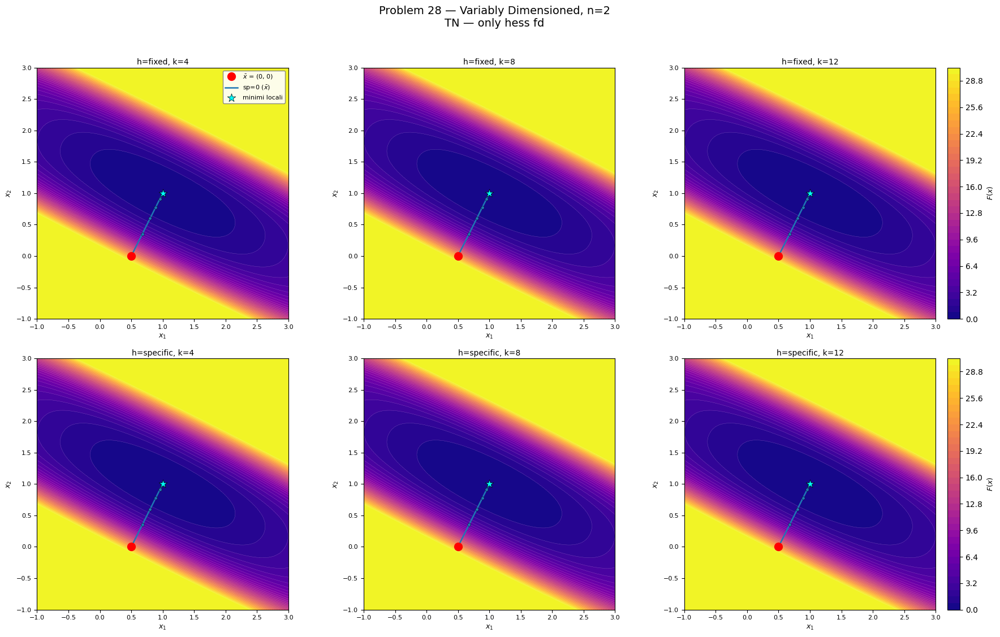

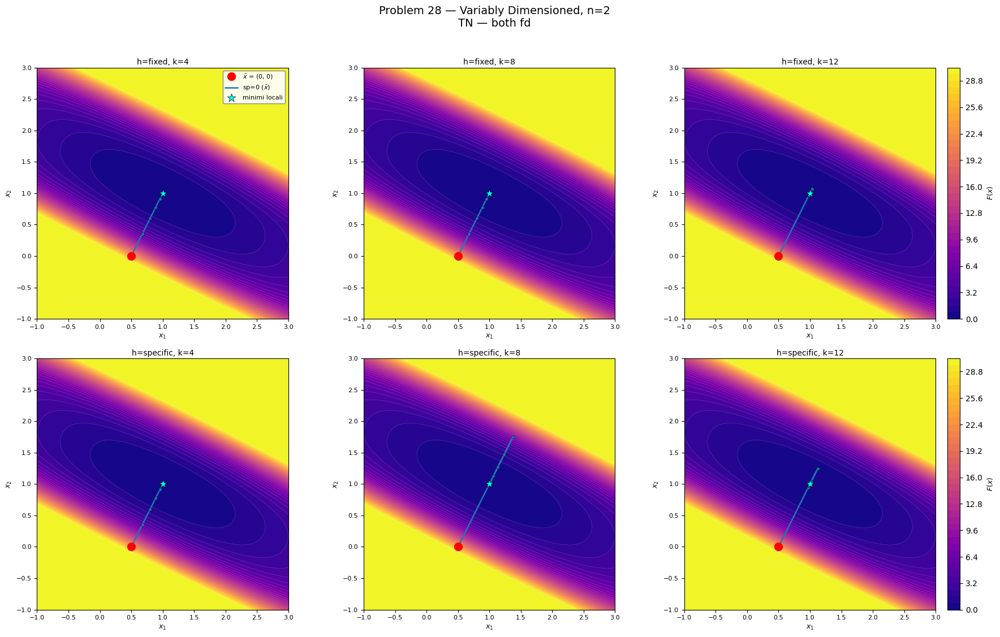

Generati 12 contour plot 2D in results\plots/


In [ ]:
# ============================================================
# Contour plot 2D con traiettorie di ottimizzazione (solo n=2)
#
# Layout:
#   Per ogni (metodo, problema) → 3 figure:
#     1. exact: singolo plot grande
#     2. only_hess_fd: griglia 2×3 (righe: fixed/specific, colonne: k=4,8,12)
#     3. both_fd: griglia 2×3 (righe: fixed/specific, colonne: k=4,8,12)
# ============================================================

if 2 not in DIMENSIONS:
    print("n=2 non incluso, contour plot saltati.")
else:
    plots_dir = results_dir / 'plots'
    plots_dir.mkdir(exist_ok=True)

    GRIDS_2D = {}
    for prob_id, pinfo in PROBLEMS.items():
        if prob_id == 'P16':
            lo, hi = -2 * np.pi, 2 * np.pi
        else:
            lo, hi = -1.0, 3.0
        N_grid = 300
        x1r = np.linspace(lo, hi, N_grid)
        x2r = np.linspace(lo, hi, N_grid)
        X1, X2 = np.meshgrid(x1r, x2r)
        Z = np.vectorize(lambda a, b: pinfo['f'](np.array([a, b])))(X1, X2)
        GRIDS_2D[prob_id] = dict(X1=X1, X2=X2, Z=Z, lo=lo, hi=hi)

    colors_sp = plt.cm.tab10(np.linspace(0, 1, 10))

    def plot_contour_subplot(ax, prob_id, method_name, dm, ht, kv,
                             show_legend=False, show_colorbar=True, fig=None):
        """Singolo subplot 2D: contourf + contour + path di ottimizzazione."""
        gr = GRIDS_2D[prob_id]
        pinfo = PROBLEMS[prob_id]

        Z_plot = gr['Z'].copy()
        if prob_id == 'P28':
            Z_plot = np.minimum(Z_plot, 30)

        cmap = 'viridis' if prob_id == 'P16' else 'plasma'
        n_levels = 40

        cf = ax.contourf(gr['X1'], gr['X2'], Z_plot, levels=n_levels,
                         cmap=cmap)
        ax.contour(gr['X1'], gr['X2'], Z_plot, levels=n_levels,
                   colors='white', linewidths=0.3, linestyles='dashed', alpha=0.4)

        if show_colorbar and fig is not None:
            cbar = fig.colorbar(cf, ax=ax, fraction=0.046, pad=0.04)
            cbar.set_label('$F(x)$', fontsize=9)

        x_bar = pinfo['x_bar_fn'](2)
        ax.plot(x_bar[0], x_bar[1], 'o', color='red', markersize=10,
                label=f'$\\bar{{x}}$ = ({x_bar[0]:.0f}, {x_bar[1]:.0f})',
                zorder=20)

        star_label_added = False
        n_starts = len(starts_cache[(prob_id, 2)])
        for si in range(n_starts):
            hist_key = (method_name, prob_id, 2, si, dm, ht, kv)
            h = histories.get(hist_key)
            if h is None or h['x_path'] is None or len(h['x_path']) == 0:
                continue
            if not h['success']:
                continue

            path = np.array(h['x_path'])
            lbl = f"sp={si}" + (r" ($\bar{x}$)" if si == 0 else "")
            ax.plot(path[:, 0], path[:, 1], '-', color=colors_sp[si],
                    linewidth=1.8, zorder=15, label=lbl)
            ax.scatter(path[:, 0], path[:, 1], color=colors_sp[si],
                       s=15, zorder=16, edgecolors='black', linewidths=0.3)

            star_lbl = 'minimi locali' if not star_label_added else None
            ax.scatter([path[-1, 0]], [path[-1, 1]], color='cyan',
                       s=120, marker='*', edgecolors='black', linewidths=0.5,
                       zorder=18, label=star_lbl)
            star_label_added = True

        ax.set_xlim(gr['lo'], gr['hi'])
        ax.set_ylim(gr['lo'], gr['hi'])
        ax.set_xlabel('$x_1$', fontsize=9)
        ax.set_ylabel('$x_2$', fontsize=9)
        ax.set_aspect('equal')
        ax.tick_params(labelsize=8)

        title = 'exact' if dm == 'exact' else f"h={ht}, k={kv}"
        ax.set_title(title, fontsize=10, pad=4)

        if show_legend:
            ax.legend(fontsize=8, loc='upper right',
                      framealpha=0.9, edgecolor='gray')

    n_plots = 0

    for method_name, _, _ in METHODS_LIST:
        for prob_id in PROBLEMS:
            prob_pretty = 'Banded Trigonometric' if prob_id == 'P16' else 'Variably Dimensioned'

            # --- 1. Exact: singolo plot grande ---
            fig, ax = plt.subplots(figsize=(8, 7))
            plot_contour_subplot(ax, prob_id, method_name, 'exact', '', '',
                                 show_legend=True, show_colorbar=True, fig=fig)
            ax.set_title(
                f"Problem {prob_id[1:]} — {prob_pretty}, n=2\n"
                f"{method_name} — exact", fontsize=13)
            plt.tight_layout()
            fig.savefig(plots_dir / f"contour_{method_name}_{prob_id}_exact.png",
                        dpi=150, bbox_inches='tight')
            plt.show()
            plt.close(fig)
            n_plots += 1

            # --- 2 & 3. Griglie 2×3 per FD ---
            for dm_label in ('only_hess_fd', 'both_fd'):
                fig, axes = plt.subplots(2, 3, figsize=(18, 11))
                dm_pretty = dm_label.replace('_', ' ')
                fig.suptitle(
                    f"Problem {prob_id[1:]} — {prob_pretty}, n=2\n"
                    f"{method_name} — {dm_pretty}",
                    fontsize=14, y=1.02)

                for col, k_val in enumerate(K_VALUES):
                    for row, h_name in enumerate(['fixed', 'specific']):
                        ax = axes[row, col]
                        plot_contour_subplot(
                            ax, prob_id, method_name,
                            dm_label, h_name, k_val,
                            show_legend=(row == 0 and col == 0),
                            show_colorbar=(col == 2), fig=fig)

                plt.tight_layout()
                fname = f"contour_{method_name}_{prob_id}_{dm_label}.png"
                fig.savefig(plots_dir / fname, dpi=150, bbox_inches='tight')
                plt.show()
                plt.close(fig)
                n_plots += 1

    print(f"Generati {n_plots} contour plot 2D in {plots_dir}/")

In [ ]:
# DEBUG: stampa x_path per MN exact P16
key = ('MN', 'P16', 2, 0, 'exact', '', '')
h = histories.get(key)
if h and h['x_path']:
    for i, pt in enumerate(h['x_path']):
        print(f"  iter {i}: x = [{pt[0]:.6f}, {pt[1]:.6f}]")

  iter 0: x = [1.000000, 1.000000]
  iter 1: x = [-983.102705, 0.809170]
  iter 2: x = [-95.197596, 0.692265]
  iter 3: x = [-95.356239, 0.459580]
  iter 4: x = [-95.354928, 0.463648]
  iter 5: x = [-95.354928, 0.463648]


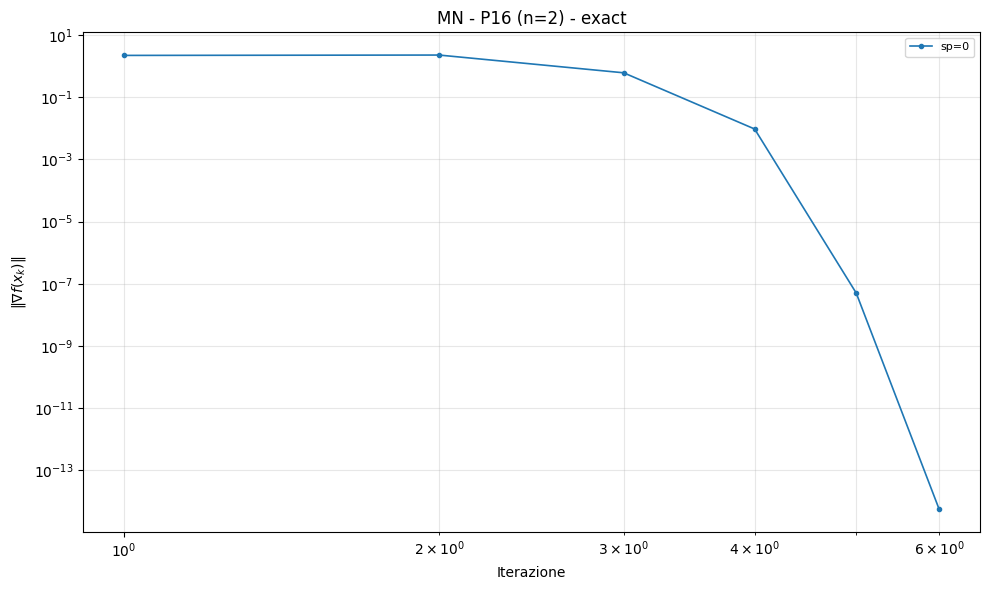

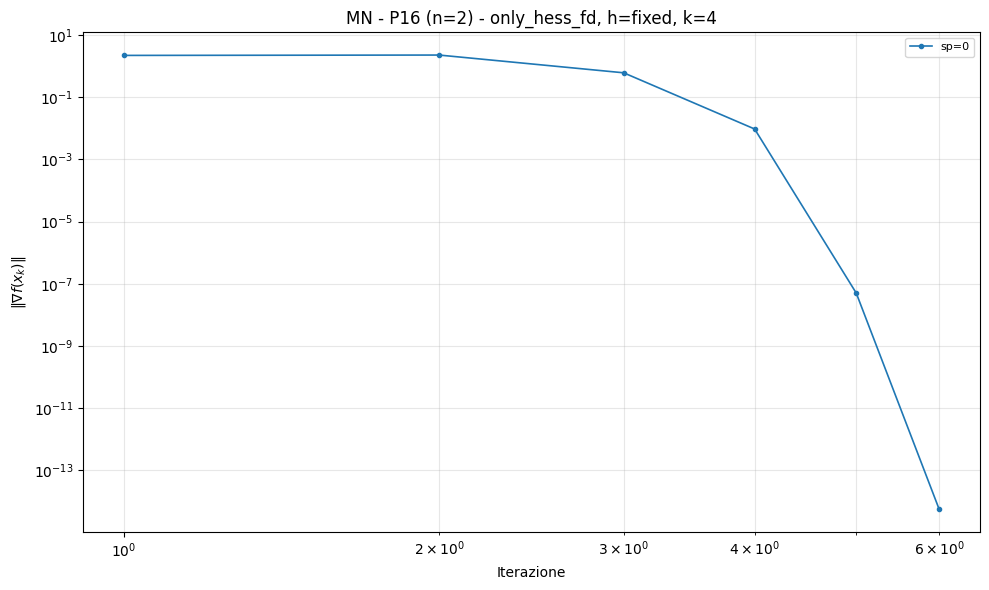

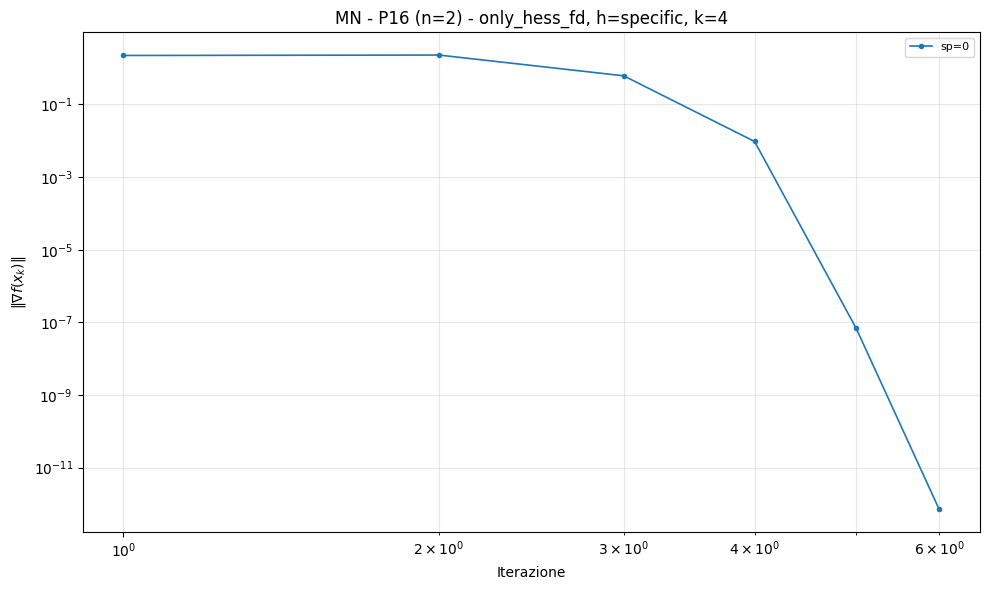

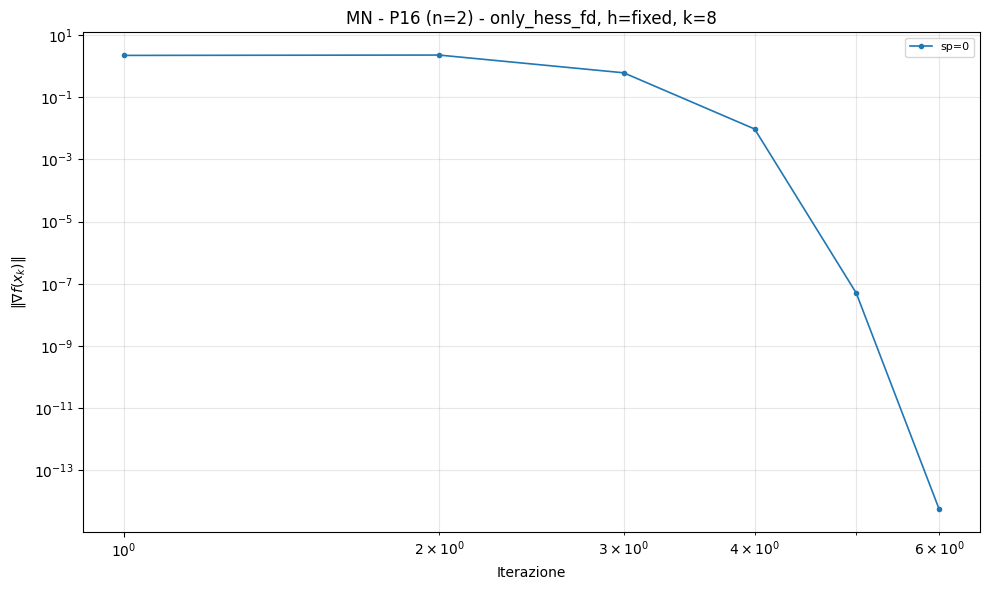

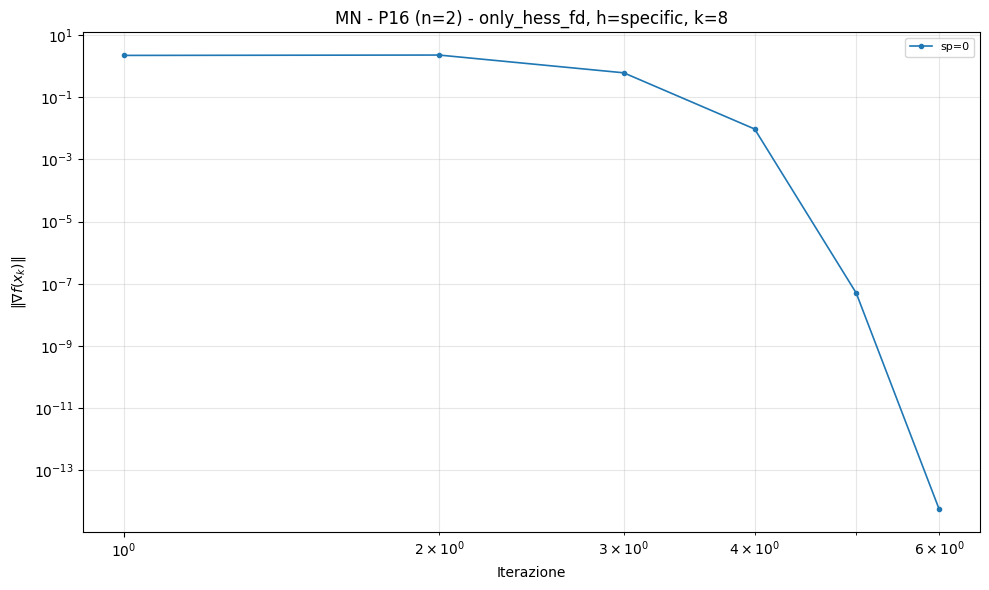

...

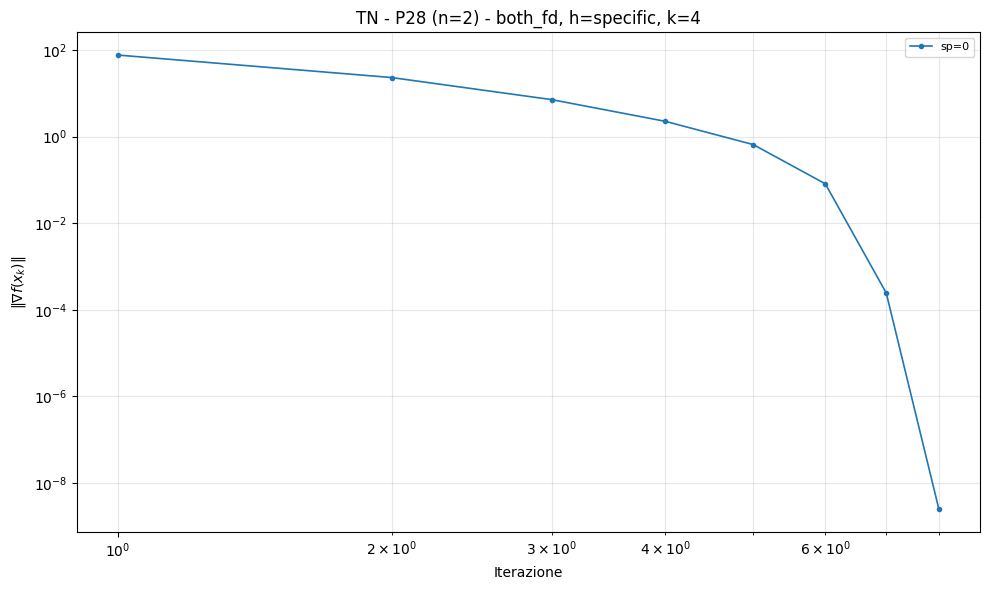

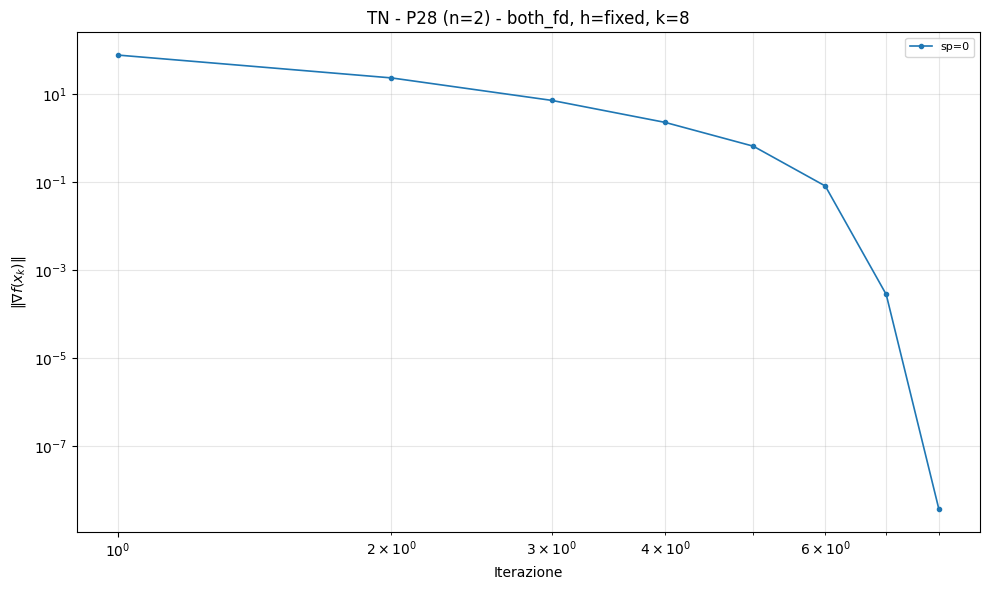

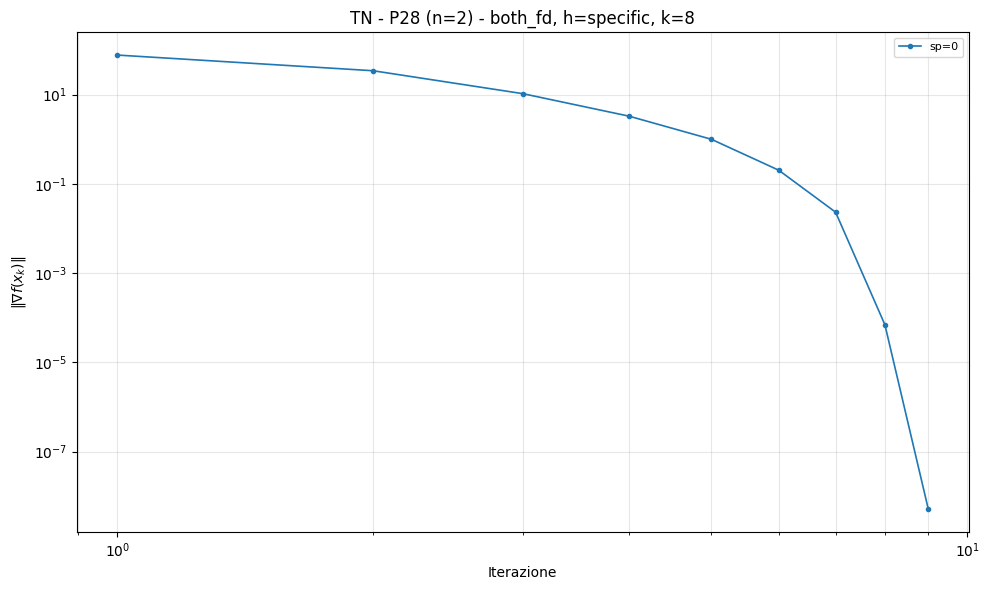

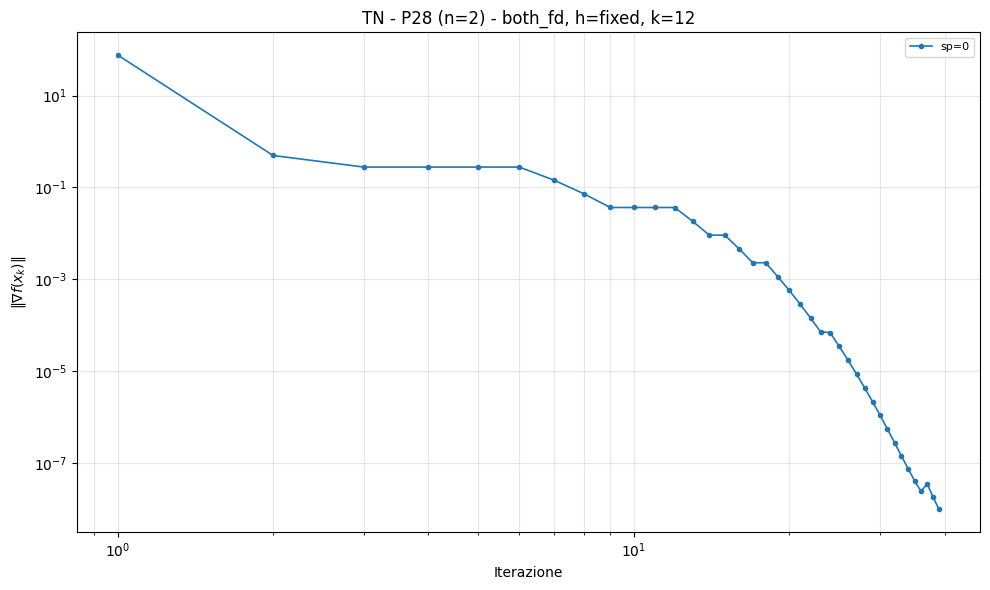

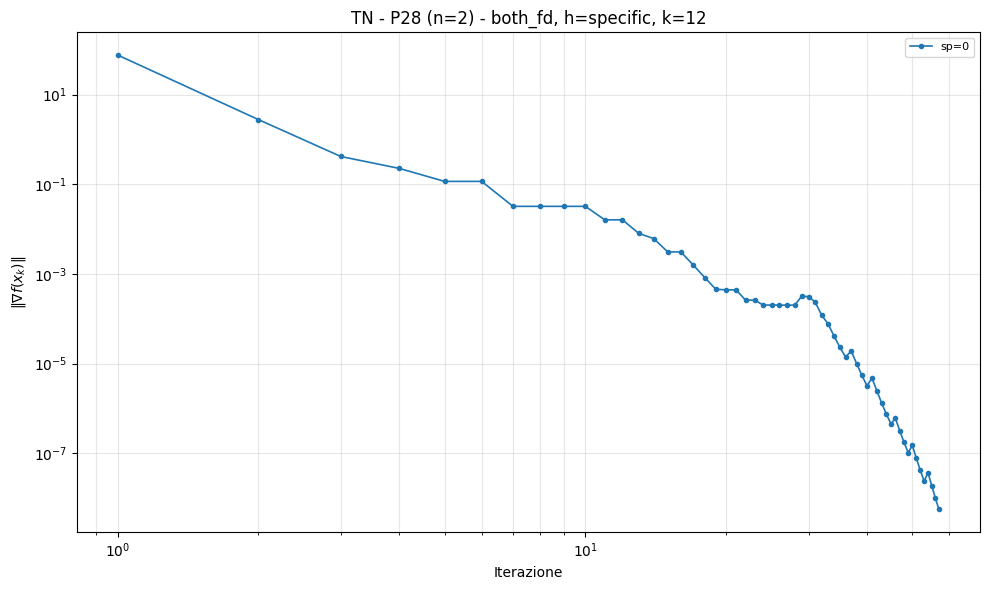

Generati 50 grafici di convergenza in results\plots/


In [ ]:
# ============================================================
# Grafici di convergenza (log-log: iterazione vs ||grad||)
# ============================================================

plots_dir = results_dir / 'plots'
plots_dir.mkdir(exist_ok=True)

n_conv_plots = 0
colors_sp = plt.cm.tab10(np.linspace(0, 1, 10))

for method_name, _, _ in METHODS_LIST:
    for prob_id in PROBLEMS:
        for n_dim in DIMENSIONS:
            for dcfg in DERIV_CONFIGS:
                dm = dcfg['deriv_mode']
                ht = dcfg['h_type']
                kv = dcfg['k'] if dcfg['k'] is not None else ''

                if should_skip(method_name, prob_id, n_dim, dm):
                    continue

                fig, ax = plt.subplots(figsize=(10, 6))
                any_plotted = False

                n_starts = len(starts_cache[(prob_id, n_dim)])
                for si in range(n_starts):
                    hist_key = (method_name, prob_id, n_dim, si, dm, ht, kv)
                    h = histories.get(hist_key)
                    if h is None or not h['success']:
                        continue
                    g = h['grad_norms']
                    if len(g) < 2:
                        continue
                    iters = np.arange(1, len(g) + 1)
                    ax.loglog(iters, g, 'o-', color=colors_sp[si],
                              markersize=3, linewidth=1.2,
                              label=f"sp={si}")
                    any_plotted = True

                if not any_plotted:
                    plt.close(fig)
                    continue

                config_str = dm
                if dm != 'exact':
                    config_str += f", h={ht}, k={kv}"
                ax.set_title(f"{method_name} - {prob_id} (n={n_dim}) - {config_str}")
                ax.set_xlabel('Iterazione')
                ax.set_ylabel(r'$\|\nabla f(x_k)\|$')
                ax.legend(fontsize=8)
                ax.grid(True, which='both', alpha=0.3)
                plt.tight_layout()

                if dm == 'exact':
                    fname = f"conv_{method_name}_{prob_id}_n{n_dim}_exact.png"
                else:
                    fname = f"conv_{method_name}_{prob_id}_n{n_dim}_{dm}_{ht}_k{kv}.png"
                fig.savefig(plots_dir / fname, dpi=150, bbox_inches='tight')
                plt.show()
                plt.close(fig)
                n_conv_plots += 1

print(f"Generati {n_conv_plots} grafici di convergenza in {plots_dir}/")

In [ ]:
# ============================================================
# Riepilogo finale
# ============================================================

print("=" * 70)
print("RIEPILOGO ESPERIMENTO")
print("=" * 70)
print(f"DRY_RUN: {DRY_RUN}")
print(f"Criterio: GradNormAbsolute(tol={STOP_TOL})")
print(f"MAX_ITER: {MAX_ITER}")
print()

# Tasso di successo per metodo
for method_name in df['method'].unique():
    mdf = df[df['method'] == method_name]
    print(f"{method_name}:")
    print(f"  Run totali: {len(mdf)}")
    print(f"  Successi:   {mdf['success'].sum()} ({mdf['success'].mean():.1%})")
    succ = mdf[mdf['success']]
    if len(succ) > 0:
        print(f"  Iter media: {succ['iters'].mean():.1f}")
        print(f"  Tempo medio: {succ['time'].mean():.2f}s")
    print()

# Successo per deriv_mode
print("Successo per deriv_mode:")
for dm in df['deriv_mode'].unique():
    sub = df[df['deriv_mode'] == dm]
    print(f"  {dm}: {sub['success'].sum()}/{len(sub)} ({sub['success'].mean():.1%})")

print()
print(f"Output:")
print(f"  CSV:    results/results.csv ({len(df)} righe)")
print(f"  Tabelle: results/tables/ ({len(list(tables_dir.glob('*.tex')))} file)")
print(f"  Grafici: results/plots/ ({len(list(plots_dir.glob('*.png')))} file)")

RIEPILOGO ESPERIMENTO
DRY_RUN: True
Criterio: GradNormAbsolute(tol=1e-08)
MAX_ITER: 1000

MN:
  Run totali: 26
  Successi:   25 (96.2%)
  Iter media: 24.3
  Tempo medio: 0.01s

TN:
  Run totali: 26
  Successi:   25 (96.2%)
  Iter media: 11.0
  Tempo medio: 0.00s

Successo per deriv_mode:
  exact: 4/4 (100.0%)
  only_hess_fd: 24/24 (100.0%)
  both_fd: 22/24 (91.7%)

Output:
  CSV:    results/results.csv (52 righe)
  Tabelle: results/tables/ (52 file)
  Grafici: results/plots/ (124 file)
